# Modeling Cross Section Data with XGB

In [3]:
import pandas as pd
import itertools
import numpy as np
import os
from joblib import dump
import time
from sklearn.neighbors import KNeighborsRegressor
import sys
from sklearn.model_selection import train_test_split

# This allows us to import the nucml utilities
sys.path.append("../..")

import nucml.exfor.data_utilities as exfor_utils 
import nucml.datasets as nuc_data 
import nucml.general_utilities as gen_utils
import nucml.model.utilities as model_utils
import nucml.exfor.plot as exfor_plot
import nucml.general_utilities as gen_utils

In [4]:
import importlib
importlib.reload(exfor_utils)
importlib.reload(gen_utils)
importlib.reload(nuc_data)
importlib.reload(gen_utils)
importlib.reload(exfor_plot)
print("Finish re-loading scripts.")

Finish re-loading scripts.


# Loading Training Results

In [5]:
results_b0 = pd.read_csv("xgb_resultsB0.csv")
results_b1 = pd.read_csv("xgb_resultsB1.csv")
results_b2 = pd.read_csv("xgb_resultsB2.csv")
results_b3 = pd.read_csv("xgb_resultsB3.csv")
results_b4 = pd.read_csv("xgb_resultsB4.csv")

# Loading Best Models

In [6]:
best_b0 = model_utils.get_best_models_df(results_b0, keep_first=True)
best_b1 = model_utils.get_best_models_df(results_b1, keep_first=True)
best_b2 = model_utils.get_best_models_df(results_b2, keep_first=True)
best_b3 = model_utils.get_best_models_df(results_b3, keep_first=True)
best_b4 = model_utils.get_best_models_df(results_b4, keep_first=True)

In [7]:
b0_train_model = model_utils.load_model_and_scaler(best_b0.iloc[[0]], model_only=True)
b1_train_model = model_utils.load_model_and_scaler(best_b1.iloc[[0]], model_only=True)
b2_train_model = model_utils.load_model_and_scaler(best_b2.iloc[[0]], model_only=True)
b3_train_model = model_utils.load_model_and_scaler(best_b3.iloc[[0]], model_only=True)
b4_train_model = model_utils.load_model_and_scaler(best_b4.iloc[[0]], model_only=True)

In [8]:
b0_val_model = model_utils.load_model_and_scaler(best_b0.iloc[[1]], model_only=True)
b1_val_model = model_utils.load_model_and_scaler(best_b1.iloc[[1]], model_only=True)
b2_val_model = model_utils.load_model_and_scaler(best_b2.iloc[[1]], model_only=True)
b3_val_model = model_utils.load_model_and_scaler(best_b3.iloc[[1]], model_only=True)
b4_val_model = model_utils.load_model_and_scaler(best_b4.iloc[[1]], model_only=True)

# Loading EXFOR Data

In [9]:
df_b0, _, _, _, _, to_scale_b0, _ = nuc_data.load_exfor(pedro=True, basic=0, normalize=False)
df_b1, _, _, _, _, to_scale_b1, _ = nuc_data.load_exfor(pedro=True, basic=1, normalize=False)
df_b2, _, _, _, _, to_scale_b2, _ = nuc_data.load_exfor(pedro=True, basic=2, normalize=False)
df_b3, _, _, _, _, to_scale_b3, _ = nuc_data.load_exfor(pedro=True, basic=3, normalize=False)
df_b4, _, _, _, _, to_scale_b4, _ = nuc_data.load_exfor(pedro=True, basic=4, normalize=False)

INFO:root: MODE: neutrons
INFO:root: LOW ENERGY: True
INFO:root: LOG: True
INFO:root: BASIC: 0
INFO:root:Reading data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/EXFOR/CSV_Files\EXFOR_neutrons\EXFOR_neutrons_MF3_AME_no_RawNaN.csv
INFO:root:Data read into dataframe with shape: (4184115, 8)
INFO:root:Splitting dataset into training and testing...
INFO:root:Normalizing dataset...
INFO:root:Fitting new scaler.
INFO:root: MODE: neutrons
INFO:root: LOW ENERGY: True
INFO:root: LOG: True
INFO:root: BASIC: 1
INFO:root:Reading data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/EXFOR/CSV_Files\EXFOR_neutrons\EXFOR_neutrons_MF3_AME_no_RawNaN.csv
INFO:root:Data read into dataframe with shape: (4184115, 11)
INFO:root:Splitting dataset into training and testing...
INFO:root:Normalizing dataset...
INFO:root:Fitting new scaler.
INFO:root: MODE: neutrons
INFO:root: LOW ENERGY: True
INFO:root: LOG: True
INFO:root: BASIC: 2
INFO:root:Reading data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/EXFOR/CSV_Files\E

# Chlorine

In [10]:
new_cl_data_kwargs = {"Z":17, "A":35, "MT":103, "log":True, "scale":False, "one_hot":True}
new_cl_data_b0 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b0, **new_cl_data_kwargs)
new_cl_data_b1 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b1, **new_cl_data_kwargs)
new_cl_data_b2 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b2, **new_cl_data_kwargs)
new_cl_data_b3 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b3, **new_cl_data_kwargs)
new_cl_data_b4 = exfor_utils.load_newdata("../../EXFOR/New_Data/Chlorine_Data/new_cl_np.csv", df_b4, **new_cl_data_kwargs)

INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:EXFOR extracted DataFrame has shape: (12, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:EXFOR extracted DataFrame has shape: (12, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:EXFOR extracted DataFrame has shape: (12, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 61)
INFO:root:EXFOR extracted DataFrame has shape: (12, 61)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 108)
INFO:root:EXFOR extracted DataFrame has shape: (12, 108)


In [12]:
def plot_chlorine(df, model, new_data, tag):
    cl_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
        df, 17, 35, 103, model, show=False, save=True, new_data=new_data, model_type='xgb',
        path="figures/Cl/{}_cl35_np.png".format(tag), get_endf=True, log=True, save_both=True)

def plot_chlorine_val(df, model, new_data, tag):
    cl_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
        df, 17, 35, 103, model, show=False, save=True, new_data=new_data, model_type='xgb',
        path="figures/Cl/{}_cl35_np_val.png".format(tag), get_endf=True, log=True, save_both=True)
    
for df, model, new_data, tag in zip([df_b0, df_b1, df_b2, df_b3, df_b4], 
                                    [b0_train_model, b1_train_model, b2_train_model, b3_train_model, b4_train_model], 
                                    [new_cl_data_b0, new_cl_data_b1, new_cl_data_b2, new_cl_data_b3, new_cl_data_b4], 
                                    ['b0', 'b1', 'b2', 'b3', 'b4']):
    plot_chlorine(df, model, new_data, tag)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted

In [13]:
for df, model, new_data, tag in zip([df_b0, df_b1, df_b2, df_b3, df_b4], 
                                    [b0_val_model, b1_val_model, b2_val_model, b3_val_model, b4_val_model], 
                                    [new_cl_data_b0, new_cl_data_b1, new_cl_data_b2, new_cl_data_b3, new_cl_data_b4], 
                                    ['b0', 'b1', 'b2', 'b3', 'b4']):
    plot_chlorine_val(df, model, new_data, tag)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted

In [15]:
cl_b1 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 17, 35, 103, b1_train_model, show=False, save=False, new_data=new_cl_data_b1, model_type="xgb",
    path="Figures/DT_B0/b1_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)


In [18]:
import xgboost as xgb

In [19]:
for_latex = pd.DataFrame(columns=["Energy", "Data", "DT"])

for_latex["Energy"] = 10**new_cl_data_b1.Energy.values
for_latex["Data"] = 10**new_cl_data_b1.Data.values
for_latex["XGB"] = 10**b1_train_model.predict(xgb.DMatrix(new_cl_data_b1.drop(columns=["Data"]).values))

In [21]:
print(for_latex.to_latex(index=False))

\begin{tabular}{rrlr}
\toprule
   Energy &   Data &  DT &      XGB \\
\midrule
2420000.0 & 0.0166 & NaN & 0.099926 \\
2420000.0 & 0.0196 & NaN & 0.099926 \\
2520000.0 & 0.0261 & NaN & 0.072726 \\
2520000.0 & 0.0257 & NaN & 0.072726 \\
2580000.0 & 0.0446 & NaN & 0.091611 \\
2580000.0 & 0.0417 & NaN & 0.091611 \\
2640000.0 & 0.0500 & NaN & 0.060848 \\
2640000.0 & 0.0478 & NaN & 0.060848 \\
2740000.0 & 0.0284 & NaN & 0.104728 \\
2740000.0 & 0.0281 & NaN & 0.104728 \\
2740000.0 & 0.0315 & NaN & 0.104728 \\
2740000.0 & 0.0324 & NaN & 0.104728 \\
\bottomrule
\end{tabular}



In [23]:
import sklearn.metrics as metrics

metrics.median_absolute_error(for_latex.Data, for_latex.XGB)

0.06111953539848328

# Tungsten (W)


In [26]:
order_dict=  {"endf":3, "exfor_ml_original":2, "exfor_ml":4, "exfor_new":1}

w_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 74, 184, 1, b1_train_model, show=True, save=True, nat_iso="N", order_dict=order_dict, model_type="xgb",
    path="figures/W/b1_W_nt.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/W184/endfb8.0/tables/xs/n-W184-MT001.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 19568 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (19576, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (19576, 43)


In [29]:
w_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 74, 184, 102, b1_train_model, show=True, save=True, nat_iso="I", model_type='xgb',
    path="figures/W/b1_W_ng.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/W184/endfb8.0/tables/xs/n-W184-MT102.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
C:\Users\Pedro\Anaconda3\envs\ml_gpu\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning:

divide by zero encountered in log10

INFO:root:EVALUATION: Finished. ENDF data contains 34673 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (202, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (202, 43)


# Chlorine

In [ ]:
w_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 17, 35, 1, b1_train_model, show=True, save=True, nat_iso="I", model_type='xgb',
    path="figures/Cl/b1_cl_ntot.png", get_endf=True, log=True, save_both=True)

# Carbon

In [32]:
order_dict=  {"endf":3, "exfor_ml_original":2, "exfor_ml":4, "exfor_new":1}

c_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 6, 12, 1, b1_train_model, show=False, save=True, nat_iso="I", order_dict=order_dict, model_type='xgb',
    path="Figures/C/b1_c12_nt.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT001.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 1338 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (23448, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (23448, 43)


In [33]:
c_b0 = exfor_utils.predicting_nuclear_xs_v2_no_norm(
    df_b1, 6, 12, 102, b1_train_model, show=False, save=True, nat_iso="I", model_type='xgb',
    path="Figures/C/b1_c12_ng.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT102.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 327 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)


In [16]:
cc_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 6, 12, 102, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=False, 
    path="Figures/DT/B1_c12_ng.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT102.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 327 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (33, 43)


In [41]:
str(type(b1_train_model)) == "<class 'xgboost.core.Booster'>"

True

In [11]:
cc_b2 = exfor_utils.predicting_nuclear_xs_v2(
    df_b2, 6, 12, 102, b2_train_model, to_scale_b2, b2_train_scaler, show=True, save=False, 
    path="Figures/DT/B2_c12_ng.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:/Users/Pedro/Desktop/ML_Nuclear_Data/Evaluated_Data\neutrons/C012/endfb8.0/tables/xs/n-C012-MT102.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 327 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (33, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (33, 50)


# Predicting XS for Cl

In [21]:
cl_dt_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b0, 17, 35, 103, b0_train_model, to_scale_b0, b0_train_scaler, show=True, save=True, 
    path="Figures/DT/B0_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 40)


In [22]:
cl_dt_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 17, 35, 103, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=True, 
    path="Figures/DT/B1_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 43)


In [23]:
cl_dt_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b2, 17, 35, 103, b2_train_model, to_scale_b2, b2_train_scaler, show=True, save=True, 
    path="Figures/DT/B2_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 50)


write about code


In [24]:
cl_dt_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b3, 17, 35, 103, b3_train_model, to_scale_b3, b3_train_scaler, show=True, save=True, 
    path="Figures/DT/B3_cl35_np.png", get_endf=True, log=True, save_both=True)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/Cl035/endfb8.0/tables/xs/n-Cl035-MT103.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 8791 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (215, 61)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (215, 61)


# Uranium Predictions

In [29]:
order_dict=  {"endf":3, "exfor_ml_original":2, "exfor_ml":4, "exfor_new":1}

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 40)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 40)


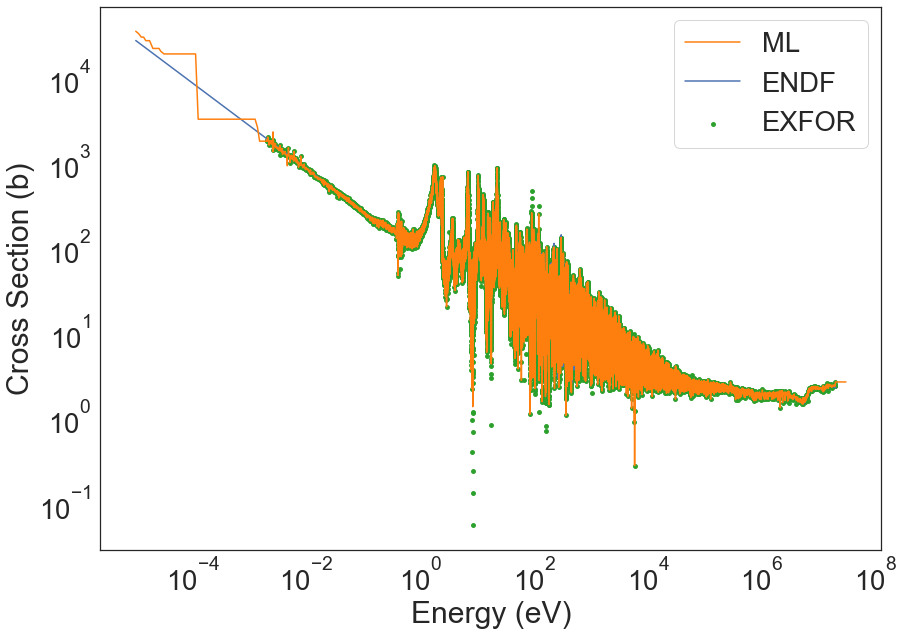

In [30]:
u_dt_b0 = exfor_utils.predicting_nuclear_xs_v2(
    df_b0, 92, 233, 18, b0_train_model, to_scale_b0, b0_train_scaler, show=True, save=True, 
    path="Figures/DT/B0_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 43)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 43)


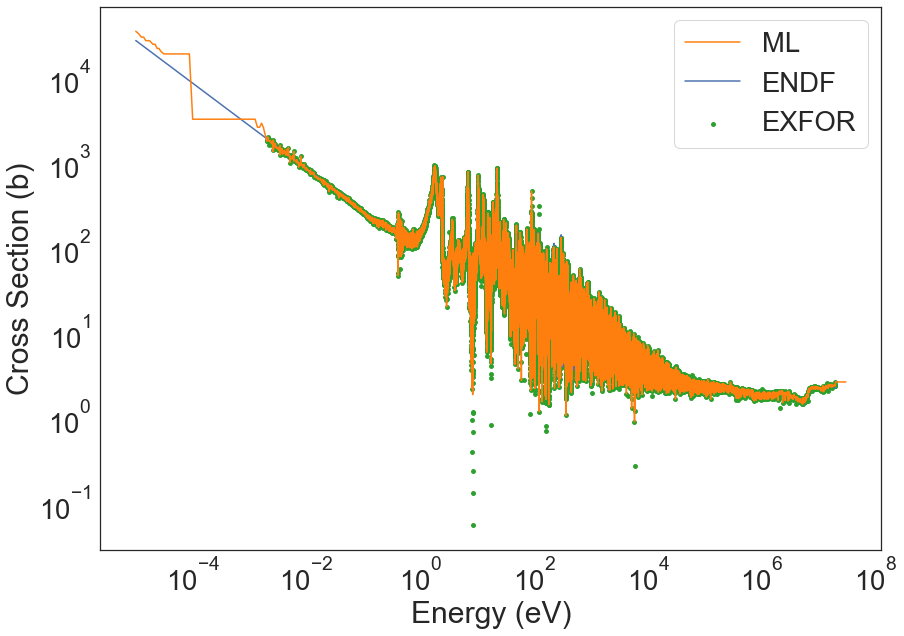

In [31]:
u_dt_b1 = exfor_utils.predicting_nuclear_xs_v2(
    df_b1, 92, 233, 18, b1_train_model, to_scale_b1, b1_train_scaler, show=True, save=True, 
    path="Figures/DT/B1_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 50)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 50)


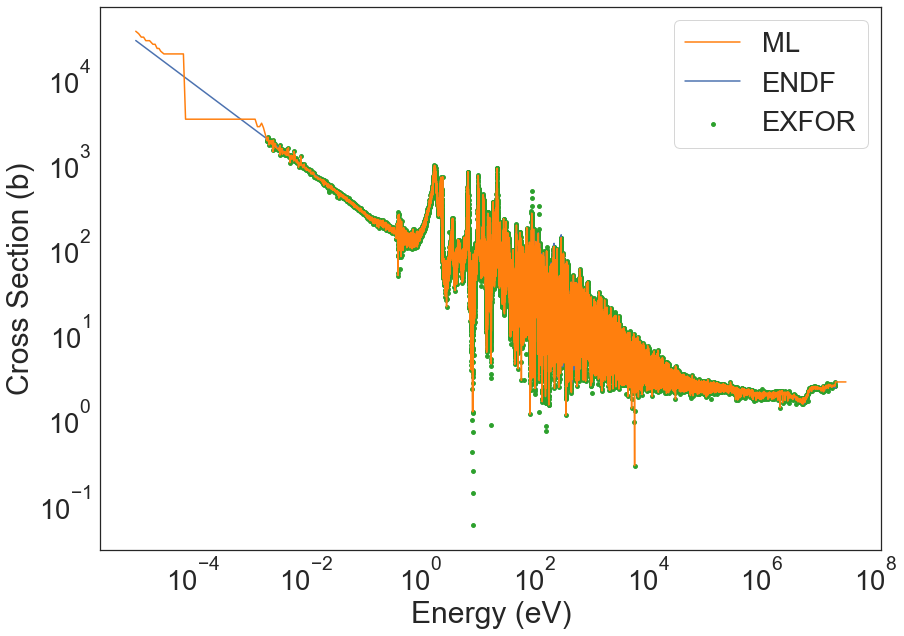

In [32]:
u_dt_b2 = exfor_utils.predicting_nuclear_xs_v2(
    df_b2, 92, 233, 18, b2_train_model, to_scale_b2, b2_train_scaler, show=True, save=True, 
    path="Figures/DT/B2_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

INFO:root:EVALUATION: Extracting data from C:\Users\Pedro\Desktop\ML_Nuclear_Data\Evaluated_Data\neutrons/U233/endfb8.0/tables/xs/n-U233-MT018.endfb8.0
INFO:root:EVALUATION: Converting MeV to eV...
INFO:root:EVALUATION: Converting mb to b...
INFO:root:EVALUATION: Finished. ENDF data contains 15345 datapoints.
INFO:root:Extracting samples from dataframe.
INFO:root:EXFOR extracted DataFrame has shape: (94567, 61)
INFO:root:Extracting samples from dataframe.
INFO:root:Scaling dataset...
INFO:root:EXFOR extracted DataFrame has shape: (94567, 61)


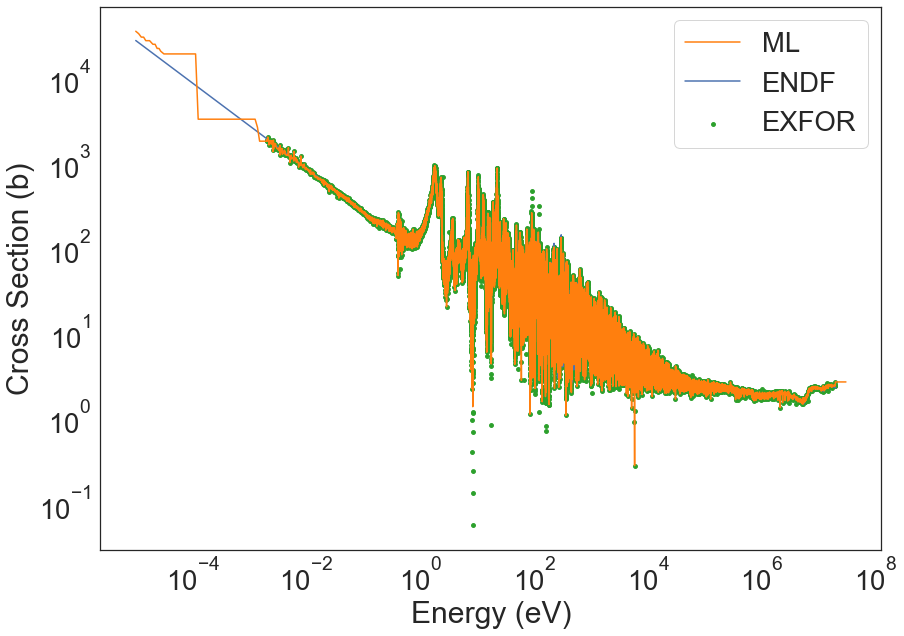

In [33]:
u_dt_b3 = exfor_utils.predicting_nuclear_xs_v2(
    df_b3, 92, 233, 18, b3_train_model, to_scale_b3, b3_train_scaler, show=True, save=True, 
    path="Figures/DT/B3_u233_fission.png", get_endf=True, log=True, save_both=True,
    plotter="plt", order_dict=order_dict)

# Inspecting Decision Tree Training Parameters

In [34]:
import plotly.express as px

In [36]:
dt_results = results.sort_values(by="max_depth")

In [43]:
dt_results

,id,max_depth,mss,msl,normalizer,train_mae,train_mse,train_evs,train_mae_m,train_r2,...,test_mae,test_mse,test_evs,test_mae_m,test_r2,model_path,training_time,scaler_path,mt_strategy,msl
374,ne_hot,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,1,60.0,2.0,NaN,standard,0.027211,0.011618,0.984903,0.000000,0.984903,...,0.135396,0.080862,0.896182,0.048207,0.896180,E:\ML_Models_EXFOR\DT_B0\DT60_MSS2_MSL1_standa...,40.941242,E:\ML_Models_EXFOR\DT_B0\DT60_MSS2_MSL1_standa...,one_hot,1.0
52,17,60.0,15.0,NaN,maxabs,0.088333,0.033536,0.955170,0.032995,0.955170,...,0.120968,0.059402,0.920423,0.046428,0.920423,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL3_maxab...,37.621245,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL3_maxab...,one_hot,3.0
51,17,60.0,15.0,NaN,poweryeo,0.088155,0.033327,0.955446,0.032939,0.955446,...,0.120657,0.058212,0.922408,0.046586,0.922408,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL3_power...,38.692487,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL3_power...,one_hot,3.0
50,16,60.0,15.0,NaN,quantilenormal,0.080321,0.028737,0.961859,0.029406,0.961859,...,0.122712,0.063774,0.915039,0.045784,0.915038,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL1_quant...,37.708274,E:\ML_Models_EXFOR\DT_B0\DT60_MSS15_MSL1_quant...,one_hot,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,666,390.0,5.0,NaN,robust,0.051778,0.016512,0.978413,0.013962,0.978413,...,0.130856,0.074669,0.902734,0.046733,0.902734,E:\ML_Models_EXFOR\DT_B0\DT390_MSS5_MSL1_robus...,37.414456,E:\ML_Models_EXFOR\DT_B0\DT390_MSS5_MSL1_robus...,one_hot,1.0
984,671,390.0,10.0,NaN,robust,0.069925,0.023541,0.968938,0.024069,0.968938,...,0.125120,0.067550,0.911028,0.045919,0.911028,E:\ML_Models_EXFOR\DT_B0\DT390_MSS10_MSL1_robu...,35.361983,E:\ML_Models_EXFOR\DT_B0\DT390_MSS10_MSL1_robu...,one_hot,1.0
988,691,394.0,10.0,NaN,robust,0.069924,0.023541,0.968939,0.024069,0.968939,...,0.125138,0.067610,0.910927,0.045921,0.910927,E:\ML_Models_EXFOR\DT_B0\DT394_MSS10_MSL1_robu...,35.860094,E:\ML_Models_EXFOR\DT_B0\DT394_MSS10_MSL1_robu...,one_hot,1.0
987,686,399.0,5.0,NaN,robust,0.051778,0.016512,0.978414,0.013962,0.978414,...,0.130875,0.074694,0.902724,0.046742,0.902723,E:\ML_Models_EXFOR\DT_B0\DT399_MSS5_MSL1_robus...,37.210233,E:\ML_Models_EXFOR\DT_B0\DT399_MSS5_MSL1_robus...,one_hot,1.0


In [82]:
with open("config.py", 'w') as f:
    f.write("ame_dir_path = 1 \n")
    f.write("evaluations_path = 1 \n")
    f.write("ensdf_path = 1\n")
    f.write("exfor_path = 1\n")

In [78]:
fig = px.scatter_3d(results_b0, x='max_depth', y='msl', z='train_mae', color='train_mae', 
                    title="Minimum Samples in Leaf - Train Dataset")

fig.update_layout(scene = dict(
                    xaxis_title='Max Depth',
                    yaxis_title='MSL',
                    zaxis_title='Train MAE'),
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10)
                 )


fig.show()
# fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_train.svg"))
# fig.write_html(os.path.join(figure_disr, "Parameter_Tuning/dt_msl_train.html"))

# fig = px.scatter_3d(results_b0, x='max_depth', y='msl', z='test_mae', color='test_mae', 
#                     title="Minimum Samples in Leaf - Test Dataset")
# fig.show()
# fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_test.svg"))
# fig.write_html(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_test.html"))

In [ ]:
fig = px.scatter_3d(dt_results, x='max_depth', y='msl', z='train_mae', color='train_mae', 
                    title="Minimum Samples in Leaf - Train Dataset")
fig.show()
fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_train.svg"))
fig.write_html(os.path.join(figure_disr, "Parameter_Tuning/dt_msl_train.html"))

fig = px.scatter_3d(dt_results, x='max_depth', y='msl', z='test_mae', color='test_mae', 
                    title="Minimum Samples in Leaf - Test Dataset")
fig.show()
fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_test.svg"))
fig.write_html(os.path.join(figure_dir, "Parameter_Tuning/dt_msl_test.html"))

In [ ]:
fig = px.scatter_3d(dt_results, x='max_depth', y='mss', z='train_mae', color='train_mae',
                    title="Minimum Samples for Split - Train Dataset")
fig.show()
fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_mss_train.svg"))
fig.write_html(os.path.join(figure_dir, "Parameter_Tuning/dt_mss_train.html"))

fig = px.scatter_3d(dt_results, x='max_depth', y='mss', z='test_mae', color='test_mae',
                    title="Minimum Samples for Split - Test Dataset")
fig.show()
fig.write_image(os.path.join(figure_dir, "Parameter_Tuning/dt_mss_test.svg"))
fig.write_html(os.path.join(figure_dir, "Parameter_Tuning/dt_mss_test.html"))

# Visualizing Results of All Models in Chlorine and Uranium

In [ ]:
def generate_cl_u_gif(model_df, df, figure_dir):
    for i in model_df["model_path"]:
        # Loading already saved Model
        print(i)
        model = load(i) 
        figure_path_cl_35 = figure_dir + "Chlorine_35/chlorine_" + os.path.splitext(os.path.basename(i))[0] + ".png"
        figure_path_u_233 = figure_dir + "Uranium_233/uranium_" + os.path.splitext(os.path.basename(i))[0] + ".png"
        figure_path_cl_37 = figure_dir + "Chlorine_37/chlorine_" + os.path.splitext(os.path.basename(i))[0] + ".png"
        figure_path_fe_56 = figure_dir + "Iron_56/iron_" + os.path.splitext(os.path.basename(i))[0] + ".png"

        cl_kwargs =  {"Z":17, "A":35, "MT":"MT_103", "clf_type":None, "scaler":scaler, "to_scale":to_scale, 
                      "E_min":0, "E_max":1.5E7, "N":0, "e_array":ace_cl, "log":True,  
                      "error":True, "show":True, "save":True, "path":figure_path_cl_35, "render":False}
        results_cl = exfor_utils.predicting_nuclear_xs(df, clf=model, new_data=new_cl_data, endf=endf_cl, **cl_kwargs)

        u_kwargs =  {"Z":92, "A":233, "MT":"MT_18", "clf_type":None, "scaler":scaler, "to_scale":to_scale, 
                      "E_min":0, "E_max":1.5E7, "N":0, "e_array":ace_u, "log":True, 
                     "error":True, "show":True, "save":True, "path":figure_path_u_233, "render":False}
        results_u = exfor_utils.predicting_nuclear_xs(df, clf=model, endf=endf_u, **u_kwargs)
        
        cl_37_kwargs =  {"Z":17, "A":37, "MT":"MT_102", "clf_type":None, "scaler":scaler, "to_scale":to_scale, 
                      "E_min":0, "E_max":1.5E7, "N":0, "e_array":ace_cl_37, "log":True,  
                      "error":True, "show":True, "save":True, "path":figure_path_cl_37, "render":False}
        results_cl_37 = exfor_utils.predicting_nuclear_xs(df, clf=model, endf=endf_cl_37, **cl_37_kwargs)
        
        fe_56_kwargs =  {"Z":26, "A":56, "MT":"MT_2", "clf_type":None, "scaler":scaler, "to_scale":to_scale, 
                      "E_min":0, "E_max":1.5E7, "N":0, "e_array":ace_fe_56, "log":True, 
                     "error":True, "show":True, "save":True, "path":figure_path_fe_56, "render":False}
        results_fe = exfor_utils.predicting_nuclear_xs(df, clf=model, endf=endf_fe_56, **fe_56_kwargs)

    plot_utils.create_gif(figure_dir + "Chlorine_35/", ".png", "chlorine_dt.gif", duration=0.5)
    plot_utils.create_gif(figure_dir + "Uranium_233/", ".png", "uranium_dt.gif", duration=0.5)
    plot_utils.create_gif(figure_dir + "Chlorine_37/", ".png", "chlorine_37_dt.gif", duration=0.5)
    plot_utils.create_gif(figure_dir + "Iron_56/", ".png", "iron_dt.gif", duration=0.5)
    
generate_cl_u_gif(dt_results, df, figure_dir)

# Getting Best Models and Visualizing Results

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
path_to_best_train_model = dt_results[dt_results.train_mae == dt_results.train_mae.min()]["model_path"].values[0]
print("Loading model saved at: {}".format(path_to_best_train_model))
train_model = load(path_to_best_train_model) 

path_to_best_test_model = dt_results[dt_results.test_mae == dt_results.test_mae.min()]["model_path"].values[0]
print("Loading model saved at: {}".format(path_to_best_test_model))
test_model = load(path_to_best_test_model) 

In [ ]:
figure_path_cl = os.path.join(figure_dir, "Chlorine_35/chlorine_35_dt.svg")

cl_kwargs =  {"Z":17, "A":35, "MT":"MT_103", "clf_type":None, "scaler":scaler, "to_scale":to_scale, "html":True,
              "e_array":"ace", "log":True, "show":True, "render":True, "save":True, "path":figure_path_cl}
results_cl = exfor_utils.predicting_nuclear_xs_v2(df, clf=train_model, new_data=new_cl_data, get_endf=True, **cl_kwargs)

In [ ]:
fig = px.bar(results_cl["error_metrics"][~results_cl["error_metrics"]["id"].str.contains("NEW")], 
             x="id", y="mae", color='mae', template="simple_white", title="EXFOR Data: ML and ENDF Error")
fig.show()
fig.write_image(os.path.join(figure_dir, "Chlorine_35/cl_35_error.svg"))
fig.write_html(os.path.join(figure_dir, "Chlorine_35/cl_35_error.html"))

fig = px.bar(results_cl["error_metrics"][results_cl["error_metrics"]["id"].str.contains("NEW")], 
             x="id", y="mae", color='mae', template="simple_white", title="New Data: ML and ENDF Error")
fig.show()
fig.write_image(os.path.join(figure_dir, "Chlorine_35/cl_35_new_error.svg"))
fig.write_html(os.path.join(figure_dir, "Chlorine_35/cl_35_new_error.html"))

In [ ]:
figure_path_cl_37 = os.path.join(figure_dir, "Chlorine_37/chlorine_37_knn.svg")

cl_37_kwargs =  {"Z":17, "A":37, "MT":"MT_102", "clf_type":None, "scaler":scaler, "to_scale":to_scale, "html":True,
              "e_array":"ace", "log":True, "show":True, "render":True, "save":True, "path":figure_path_cl_37}
results_cl_37 = exfor_utils.predicting_nuclear_xs_v2(df, clf=train_model, get_endf=True, **cl_37_kwargs)

In [ ]:
fig = px.bar(results_cl_37["error_metrics"], x="id", y="mae", color='mae', template="simple_white", 
             title="EXFOR Data: ML and ENDF Error")
fig.show()
fig.write_image(os.path.join(figure_dir, "Chlorine_37/cl_37_error.svg"))
fig.write_html(os.path.join(figure_dir, "Chlorine_37/cl_37_error.html"))

In [ ]:
figure_path_u = os.path.join(figure_dir, "Uranium_233/uranium_233_dt.svg")

order = {
    "3":"endf", 
    "1":"exfor_ml_original", 
    "2":"exfor_ml", 
    "4":"exfor_new"}

u_kwargs =  {"Z":92, "A":233, "MT":"MT_18", "clf_type":None, "scaler":scaler, "to_scale":to_scale, "html":True,
              "e_array":"ace", "log":True, "show":True, "render":True, "save":True, "path":figure_path_u,
             "order_dict":order}
results_u = exfor_utils.predicting_nuclear_xs_v2(df, clf=train_model, get_endf=True, **u_kwargs)

In [ ]:
fig = px.bar(results_u["error_metrics"], x="id", y="mae", color='mae', template="simple_white", 
             title="EXFOR Data: ML and ENDF Error")
fig.show()
fig.write_image(os.path.join(figure_dir, "Uranium_233/u_233_error.svg"))
fig.write_html(os.path.join(figure_dir, "Uranium_233/u_233_error.html"))

In [ ]:
figure_path_fe = os.path.join(figure_dir, "Iron_56/iron_56_knn.svg")

fe_kwargs =  {"Z":26, "A":56, "MT":"MT_2", "clf_type":None, "scaler":scaler, "to_scale":to_scale, "html":True,
              "e_array":"ace", "log":True, "show":True, "render":True, "save":True, "path":figure_path_fe}
results_fe = exfor_utils.predicting_nuclear_xs_v2(df, clf=train_model, get_endf=True, **fe_kwargs)

In [ ]:
fig = px.bar(results_fe["error_metrics"], x="id", y="mae", color='mae', template="simple_white", 
             title="EXFOR Data: ML and ENDF Error")
fig.show()
fig.write_image(os.path.join(figure_dir, "Iron_56/fe_56_error.svg"))
fig.write_html(os.path.join(figure_dir, "Iron_56/fe_56_error.html"))